In [12]:
%%capture
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [48]:
#adata = sc.read('/Users/lukas.simon/OneDrive/Miko/UTHealth/projects/BatchBalancedTriplets/data/pancreas_raw/pancreas_combined.h5ad')
adata = sc.read('/Users/lukas.simon/Downloads/Simulation_data.h5')
adata

AnnData object with n_obs × n_vars = 4000 × 2000 
    obs: 'cells', 'batch', 'n_counts'
    uns: 'batch_colors', 'cells_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

### Run TNN

In [49]:
from tnn.tnn import *

In [50]:
class MyCustomCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, batch, logs=None):
        embedding = self.model.layers[3].predict(adata.obsm['X_pca'])
        embeddings.append(embedding)

In [80]:
%%time
embeddings = []
adata_tnn = adata.copy()
model = TNN(k = 20, batch_size = 64, epochs= 100, n_epochs_without_progress = 5, verbose = 0, callbacks=[MyCustomCallback()])
model.fit(X = adata, batch_name = "batch", Y = None)
embedding = model.transform(X = adata)

version 0.0.1. 15:00, 04/22/2020
Total cells for training:2106
Wall time: 15.4 s


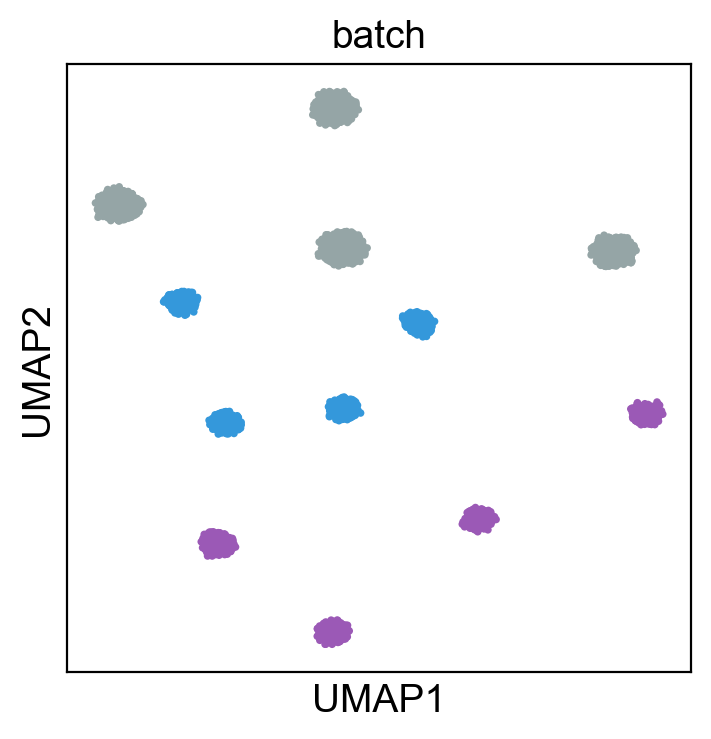

In [82]:
sc.pl.umap(adata, color = 'batch', legend_loc = None)

In [75]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

In [77]:
sc.set_figure_params(dpi=100, dpi_save=300)

In [83]:
np.max(np.stack([np.max(i, 0) for i in embeddings]), 0)

array([4.6851444, 4.710911 ], dtype=float32)

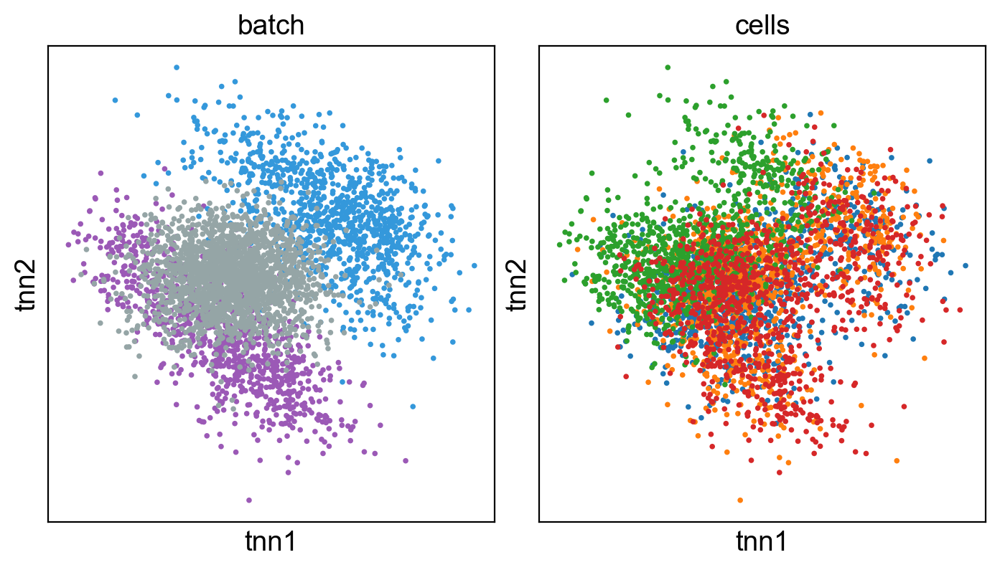

In [135]:
adata_tnn.obsm["X_tnn"] = embeddings[0]
p1 = sc.pl.scatter(adata_tnn, basis = 'tnn', color = ['batch', 'cells'], legend_loc = 'none', show = False)
plt.savefig("/Users/lukas.simon/OneDrive/Miko/UTHealth/projects/BatchBalancedTriplets/figures/simulation_animation_start.png")   

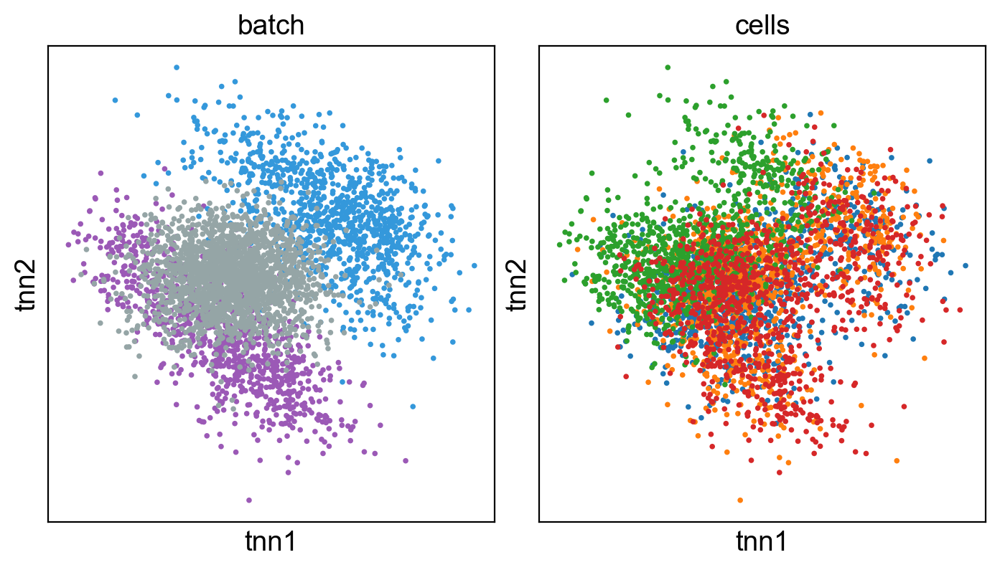

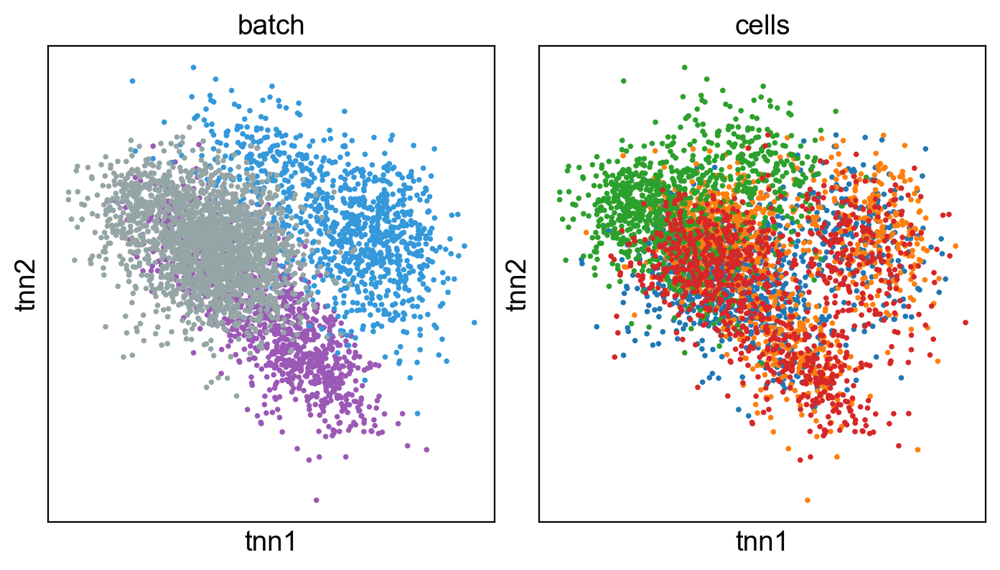

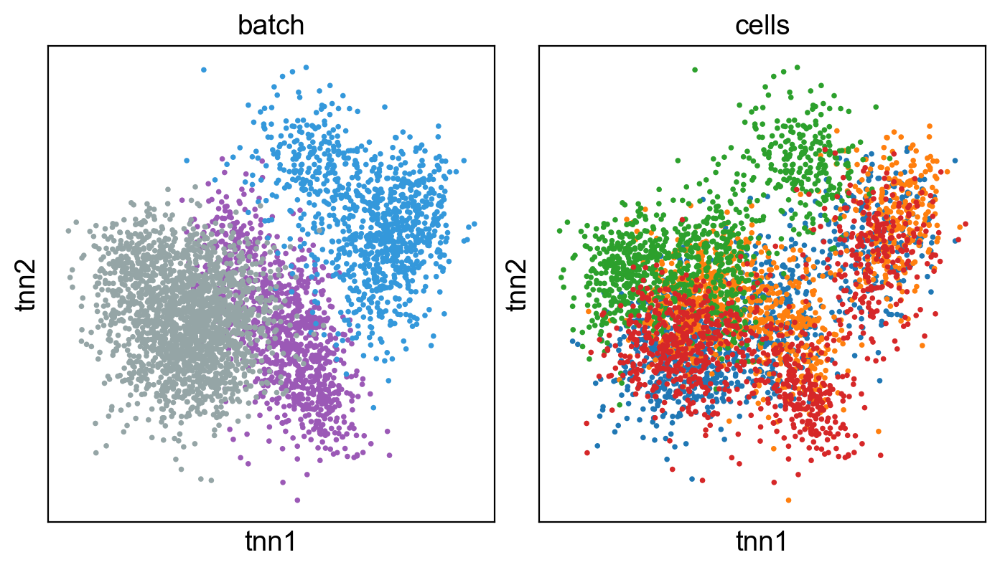

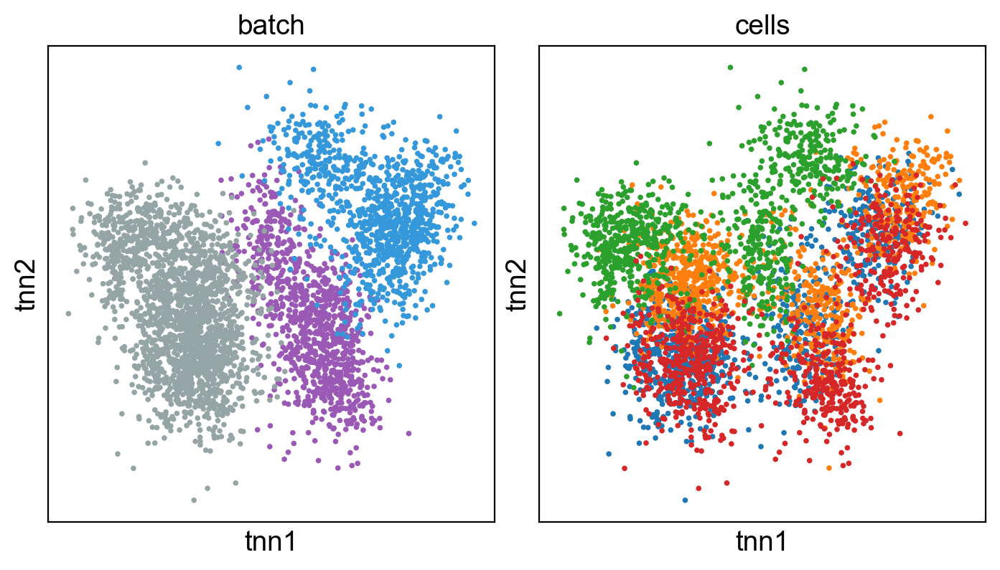

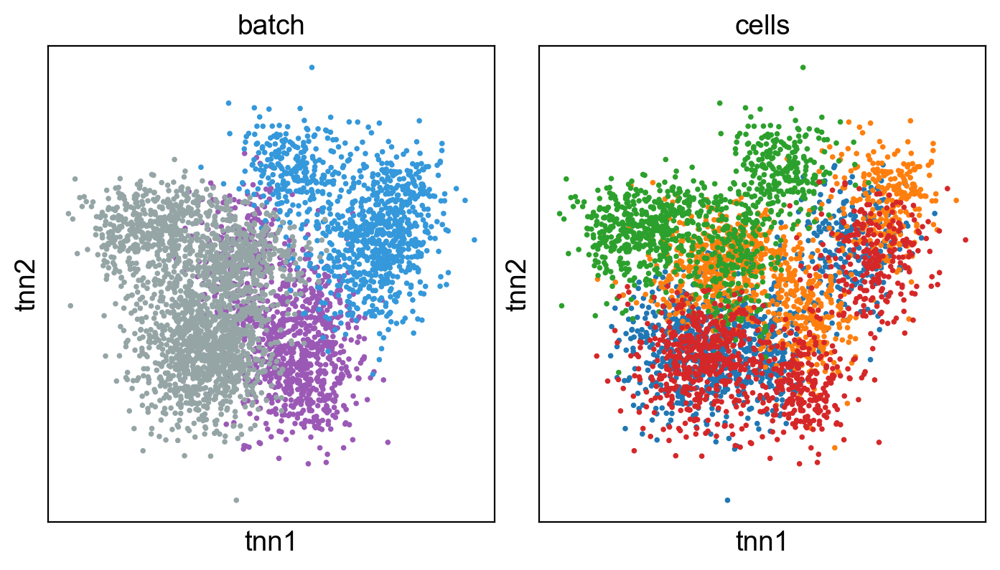

...

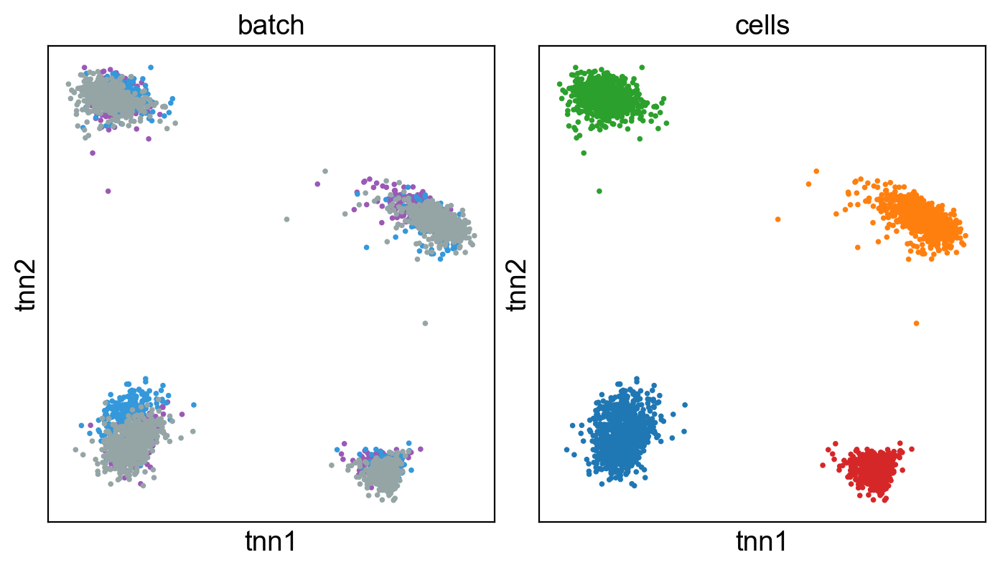

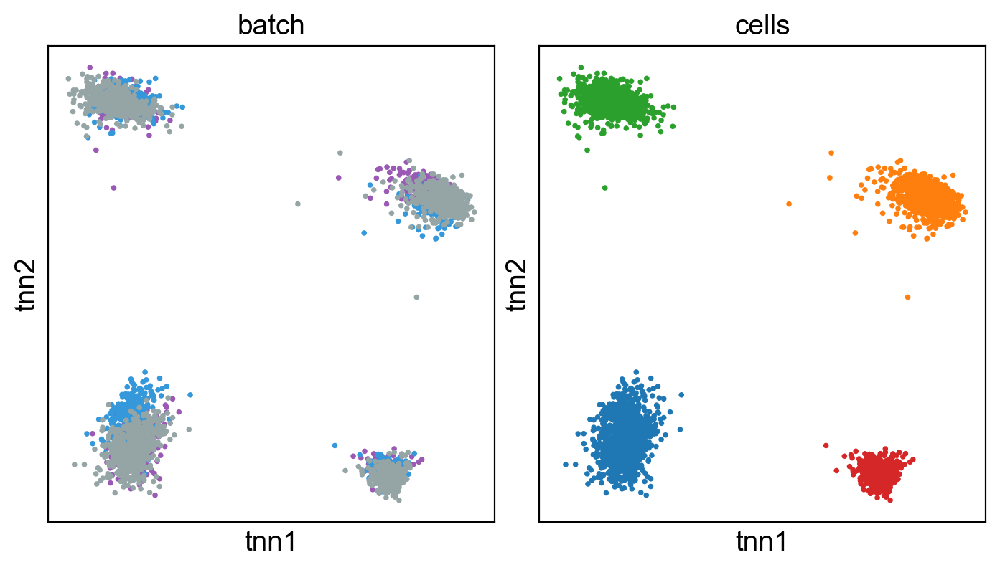

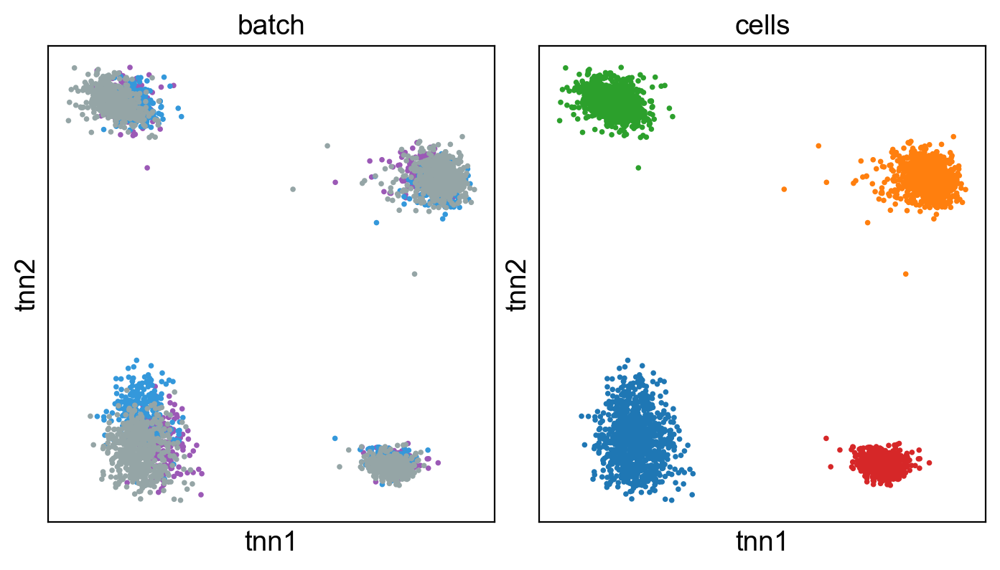

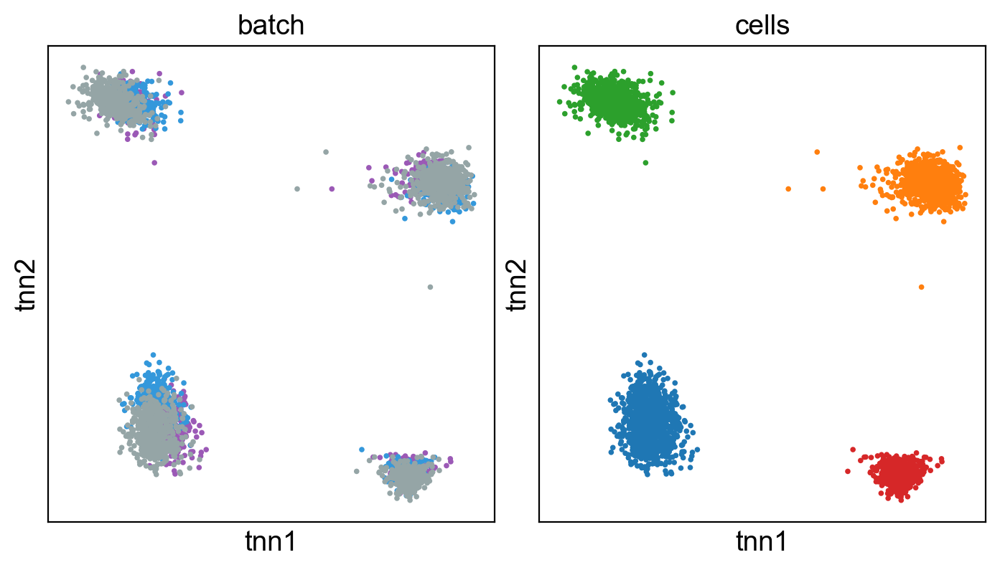

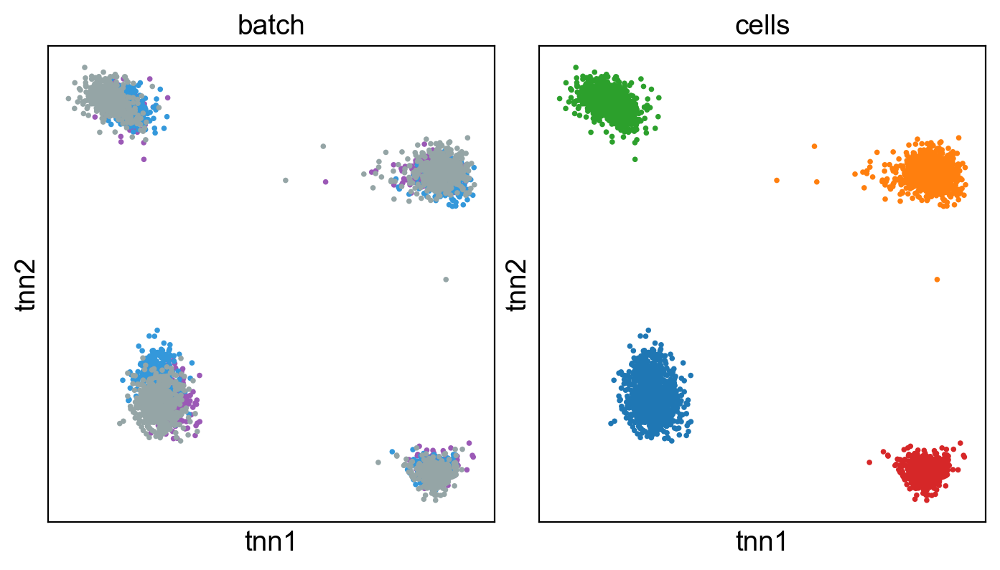

In [130]:
for i in np.arange(0, len(embeddings)):
    adata_tnn.obsm["X_tnn"] = embeddings[i]
    p1 = sc.pl.scatter(adata_tnn, basis = 'tnn', color = ['batch', 'cells'], legend_loc = 'none', show = False)
    #p1.set_ylim(ymin=-10, ymax=10)
    #p1.set_xlim(xmin=-10, xmax=10)
    plt.savefig("/Users/lukas.simon/OneDrive/Miko/UTHealth/projects/BatchBalancedTriplets/figures/Simulation animation/simulation_animation" + str(i) + ".png")

In [134]:
import imageio
images = []
filenames = ["/Users/lukas.simon/OneDrive/Miko/UTHealth/projects/BatchBalancedTriplets/figures/Simulation animation/simulation_animation" + str(i) + ".png" for i in np.arange(0, len(embeddings))]
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('/Users/lukas.simon/OneDrive/Miko/UTHealth/projects/BatchBalancedTriplets/Simulation_animation.gif', images, duration = 0.2)